<a href="https://colab.research.google.com/github/weixx462/Auduio-Image-Style-Transfer/blob/main/Audio_Image_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup



##Spectrogram

In [ ]:
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile

sample_rate, samples = wavfile.read('blues.00009.wav')
frequencies, times, spectrogram = signal.spectrogram(samples, sample_rate)

plt.pcolormesh(times, frequencies, spectrogram)
plt.imshow(spectrogram)
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

### Configurations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import tensorflow as tf
 import matplotlib.pyplot as plt
import matplotlib
import time
import functoolsimport numpy as np
from PIL import Imagefrom tensorflow.python.keras.preprocessing import image as preprocessing_image
from tensorflow.python.keras import models, losses, layers
tf.enable_eager_execution()

Mounted at /content/drive


In [ ]:
# content_path = '/tmp/nst/newyork.jpg'
content_path = '/content/cat.jpg'
# style_path = '/tmp/nst/metal00018.png'
# style_path = '/tmp/nst/classical00004.png'
# style_path = '/content/classical00004.png'
# style_path = '/content/metal00018.png'
# style_path = '/content/jazz00066.png'
style_path = '/content/hiphop00003.png'
# style_path = '/tmp/nst/blues00009.png'
# style_path = '/tmp/nst/chouxiang.jpg'

## Input display

In [ ]:
def load_img(path_to_img):
  image = Image.open(path_to_img).convert('RGB')
  scale = 512/max(image.size)
  image = img.resize((round(image.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  image = preprocessing_image.img_to_array(image)
  image = np.expand_dims(image, axis=0)
  return image
 
def imshow(img, name):
  temp = plt.imshow(np.squeeze(img, axis=0).astype('uint8'))
  plt.title(name)
  plt.imshow(temp)

In [ ]:
content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

<PIL.Image.Image image mode=RGB size=512x512 at 0x7F64C2029EF0>
<PIL.Image.Image image mode=RGB size=512x335 at 0x7F64C2029F98>


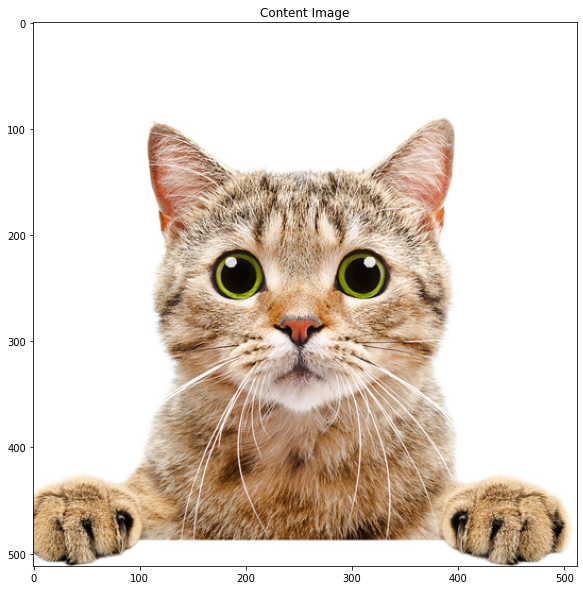

In [ ]:
imshow(content, 'Content Image')

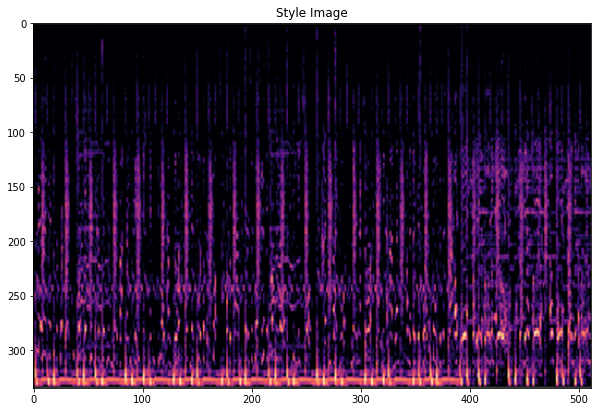

In [ ]:
imshow(style, 'Style Image')

In [ ]:

def convert_image(image):
  x = image.copy()
  x[:, :, 0] += 104
  x[:, :, 1] += 117
  x[:, :, 2] += 124
  x = x[:, :, ::-1]
  x = np.clip(x, 0, 255).astype('uint8')
  return x

content_layers = ['block5_conv2'] 

style_layers = [
                'block1_conv1',
                'block2_conv1',
                'block3_conv1'
               ]

def gram_matrix(input):
  a = tf.reshape(input, [-1, int(input.shape[-1])])
  n = tf.shape(a)[0]
  return tf.matmul(a, a, transpose_a=True) / tf.cast(n, tf.float32)
 
def build_model():
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  # vgg = tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')
  vgg.trainable = False
  style_intermediate_outputs = [vgg.get_layer(_).output for _ in style_layers]
  content_intermediate_outputs = [vgg.get_layer(_).output for _ in content_layers]
  model_outputs = style_intermediate_outputs + content_intermediate_outputs
  return models.Model(vgg.input, model_outputs)
 
def get_features(model, content_path, style_path):
  content_image = tf.keras.applications.vgg19.preprocess_input(load_img(content_path))
  style_image = tf.keras.applications.vgg19.preprocess_input(load_img(style_path))
  
  style_features = [_[0] for _ in model(style_image)[:len(style_layers)]]
  content_features = [_[0] for _ in model(content_image)[len(style_layers):]]
  return style_features, content_features
 
def get_loss(base, target):
  return tf.reduce_mean(tf.square(base - target))
 
def compute_loss(model, style_features, content_features, loss_weights, opt_image):
  style_weight, content_weight = loss_weights
  output = model(opt_image)
  style_score = 0
  content_score = 0
 
  for target_style, combined_style in zip(style_features, output[:len(style_layers)]):
    style_score += 1.0 / float(len(style_layers)) * get_loss(gram_matrix(combined_style[0]), target_style)
 
  for target_content, combined_content in zip(content_features, output[len(style_layers):]):
    content_score += 1.0 / float(len(content_layers)) * get_loss(combined_content[0], target_content)
  
  style_score = style_score * style_weight
  content_score = content_score * content_weight
  loss = style_score + content_score 
 
  return loss, style_score, content_score
 
def compute_grads(config):
  with tf.GradientTape() as gradient_tape: 
    all_loss = compute_loss(**config)
  return gradient_tape.gradient(all_loss[0], config['opt_image']), all_loss

### Perform Style Transfer

In [ ]:
import IPython.display
 
def perform_style_transfer(content_path, 
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3, 
                       style_weight=1e-3): 
 
  model = build_model() 
  for layer in model.layers:
    layer.trainable = False
 
  opt_image = tf.Variable(load_and_process_img(content_path), dtype=tf.float32)
  optimizer = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)
 
  style_features, content_features = get_features(model, content_path, style_path)
  style_features = [gram_matrix(_) for _ in style_features]
  minv = -np.array([104, 117, 124])
  maxv = 255 - np.array([104, 117, 124])
  best_loss, best_img = float('inf'), None
  interval = num_iterations/10
  loss_weights = (style_weight, content_weight)
  config = {
      'model': model,
      'loss_weights': loss_weights,
      'opt_image': opt_image,
      'style_features': style_features,
      'content_features': content_features
  }
    
  images_list = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(config)
    loss, style_score, content_score = all_loss
    optimizer.apply_gradients([(grads, opt_image)])
    cbv_img = tf.clip_by_value(opt_image, minv, maxv)
    opt_image.assign(cbv_img)
    if i % interval == 0:
      temp_img = opt_image.numpy()
      temp_img = convert_image(temp_img)
      images_list.append(temp_img)
    if loss < best_loss:
      best_loss = loss
      best_img = convert_image(opt_image.numpy())
      best_model_outputs = model(opt_image)
  plt.figure(figsize=(20,5))
  for i,img in enumerate(images_list):
      plt.subplot(2, 5, i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
  return best_img, best_loss, best_model_outputs

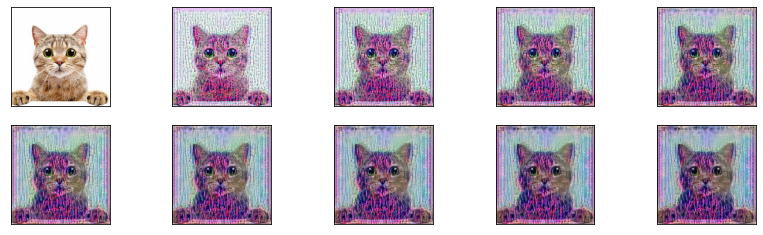

In [ ]:
best_img, best_loss, best_model_outputs = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

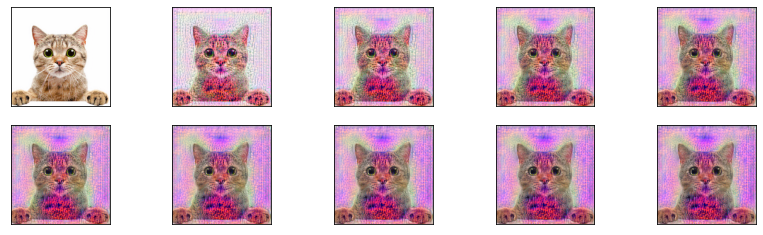

In [ ]:
best_img, best_loss, best_model_outputs = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

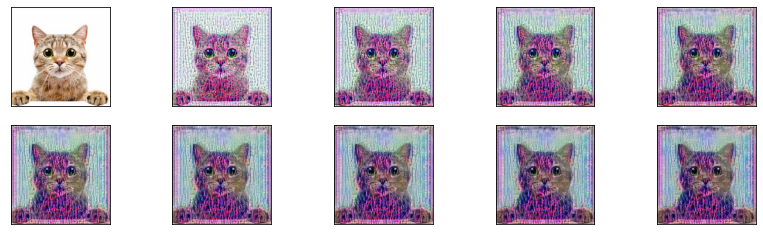

In [ ]:
best_img, best_loss, best_model_outputs = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

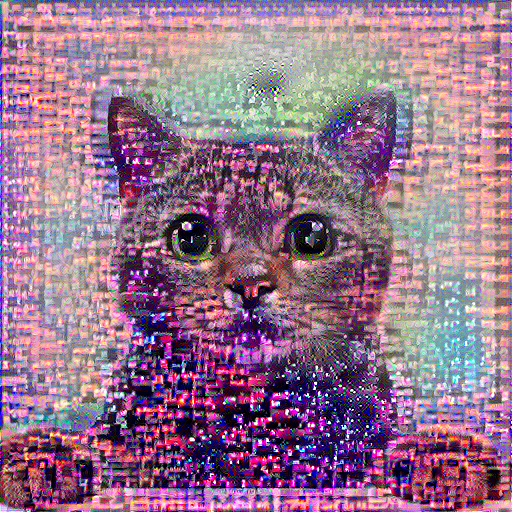

In [ ]:
cat_jazz = Image.fromarray(best)

cat_jazz.save("cat_jazz.jpg")
cat_jazz

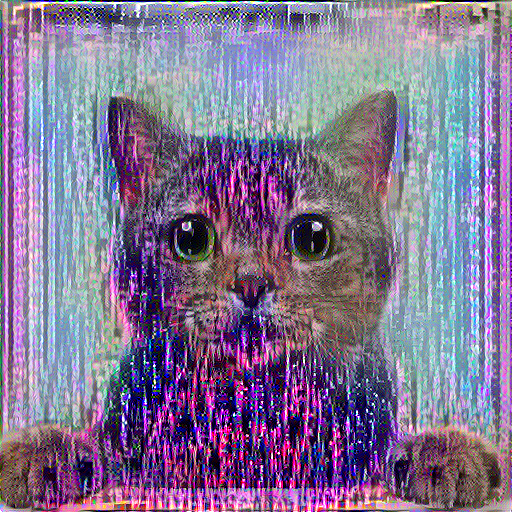

In [ ]:
cat_hippop = Image.fromarray(best)

cat_hippop.save("cat_hippop.jpg")
cat_hippop

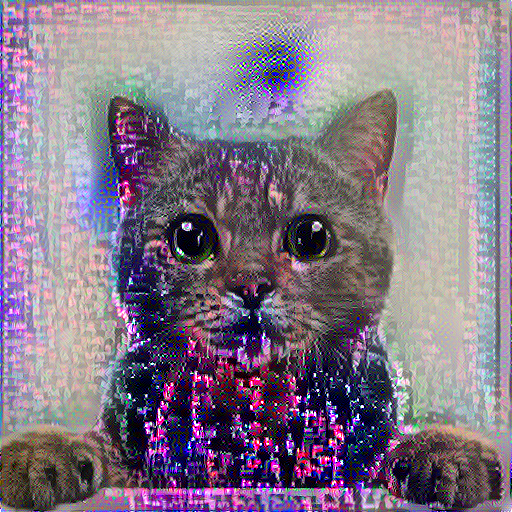

In [ ]:
cat_blue = Image.fromarray(best)

cat_blue.save("cat_blue.jpg")
cat_blue

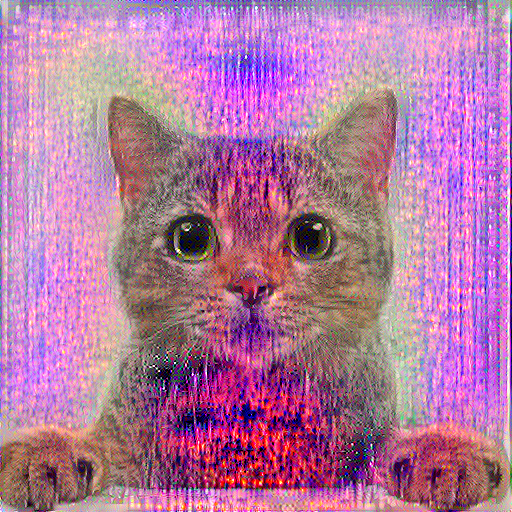

In [ ]:
cat_metal = Image.fromarray(best)

cat_metal.save("cat_metal.jpg")
cat_metal

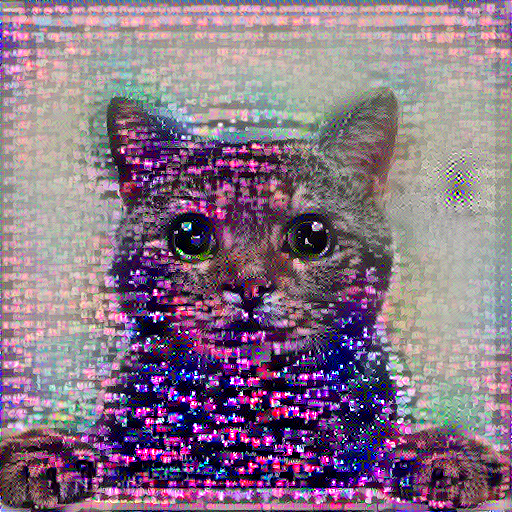

In [ ]:
cat_classical = Image.fromarray(best)

cat_classical.save("cat_classical.jpg")
cat_classical

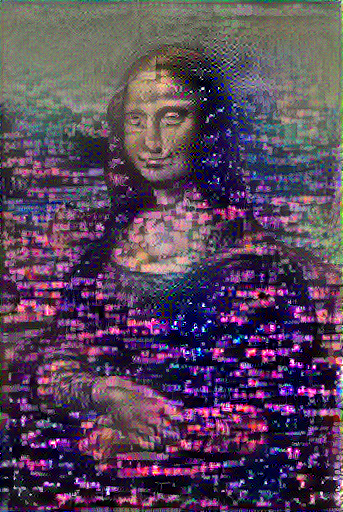

In [ ]:
meno_classical = Image.fromarray(best)

meno_classical.save("meno_classical.jpg")
meno_classical

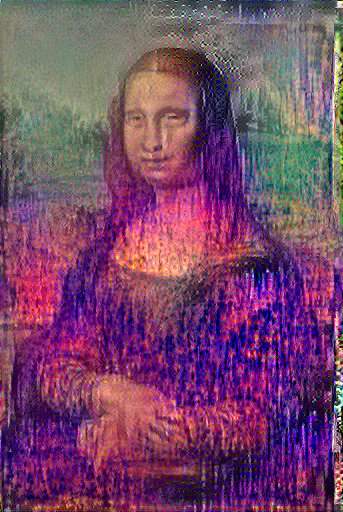

In [ ]:
meno = Image.fromarray(best)

meno.save("meno_metal.jpg")
meno

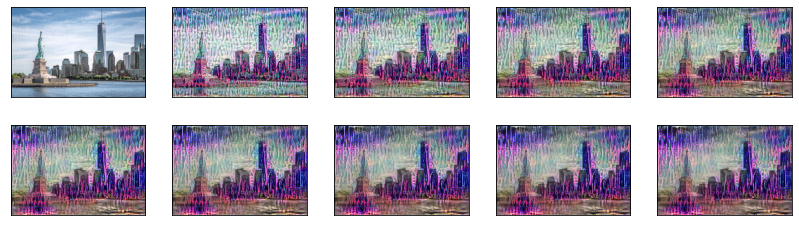

In [ ]:
best_img, best_loss, best_model_outputs = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

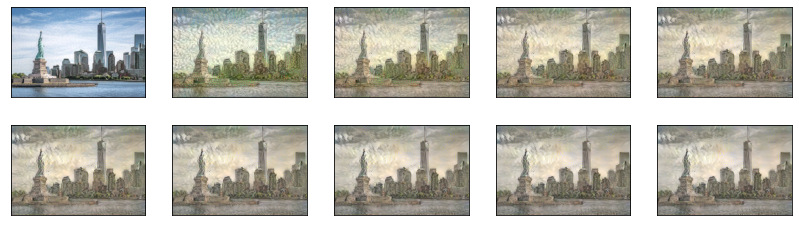

In [ ]:
best_img, best_loss, best_model_outputs = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

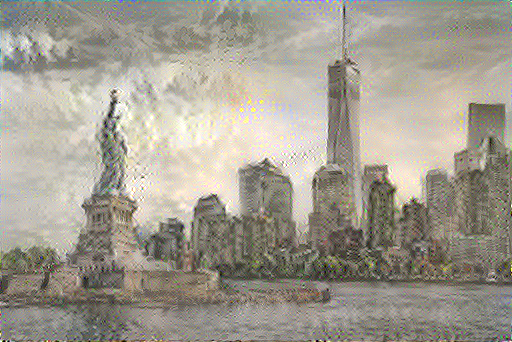

In [ ]:

shuimo = Image.fromarray(best)

shuimo.save("newyork_shuimo.jpg")
shuimo

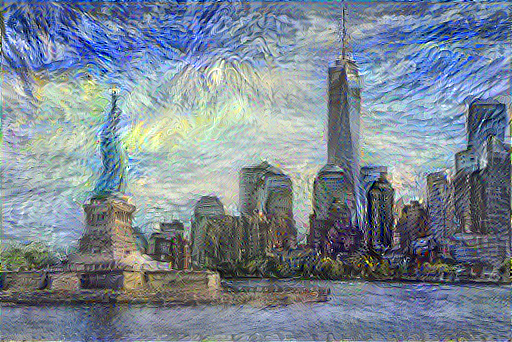

In [ ]:

shuimo = Image.fromarray(best)

shuimo.save("newyork_vangogh.jpg")
shuimo

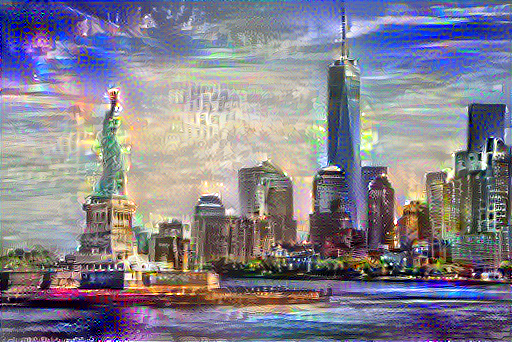

In [ ]:
shanghai = Image.fromarray(best)

shanghai.save("newyork_shanghai.jpg")
shanghai

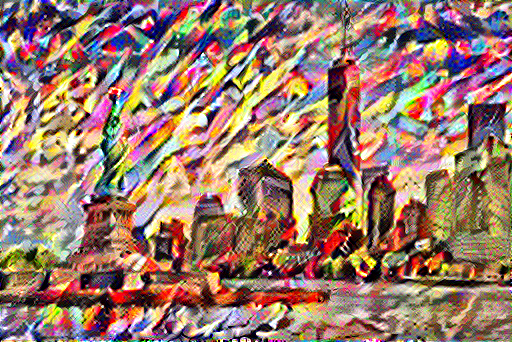

In [ ]:
chouxiang = Image.fromarray(best)

chouxiang.save("newyork_chouxiang.jpg")
chouxiang

In [ ]:
best, best_loss = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

In [ ]:
#classical00004 
best, best_loss = perform_style_transfer(content_path, 
                                     style_path, num_iterations=1000)

In [ ]:
#blue
im = Image.fromarray(best)

im.save("blue.jpg")
im

In [ ]:
#hiphop
im = Image.fromarray(best)

im.save("hiphop.jpg")
im

In [ ]:
#classical00004 
im = Image.fromarray(best)

im.save("classical.jpg")
im

In [ ]:
#classical00004 
im = Image.fromarray(best)

im.save("hiphop.jpg")
im

In [ ]:
#a = 1e3, b = 1e-4, a / b = 1e7
im = Image.fromarray(best)

im.save("output.jpg")
im

In [ ]:
#a = 1e3, b = 1e-2, a / b = 1e5
im1 = Image.fromarray(best)

im1.save("e5.jpg")
im1

In [ ]:
#a = 1e2, b = 1e-1, a / b = 1e3
im1 = Image.fromarray(best)

im1.save("e3.jpg")
im1

In [ ]:
Image.fromarray(best)

In [ ]:
#a = 1e2, b = 1e-1, a / b = 1e3
im1 = Image.fromarray(best)

im1.save("e8.jpg")
im1

In [ ]:
Image.fromarray(best)